##### First, we will load the modules and inference data and define some settings

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

##### Duplicate mutants which we excluded

In [2]:
db_ = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'Id25c03_1merNCLB.txt'), sep=' ', header=None)
db_['idx'] = db_[0] + '_' + db_[1]
db_.loc[db_['idx'].duplicated(keep='last')]

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,idx
2011,2K7J,AA29E,0.41,10,0,0,1,NMRl,0.0,1,...,AEHTQAEGK,5.5,28.0,0.4,40.7,91095,10884358,Urea,Acylphophatase-1,2K7J_AA29E
2012,2K7J,GA31A,1.74,10,0,0,1,NMRl,0.0,1,...,GAQAEGKKL,5.5,28.0,0.02,1.9,91096,10884358,Urea,Acylphophatase-1,2K7J_GA31A


### Supplementary Figure 2: Mutant Amino Acid Distributions for K2369 and Q3421

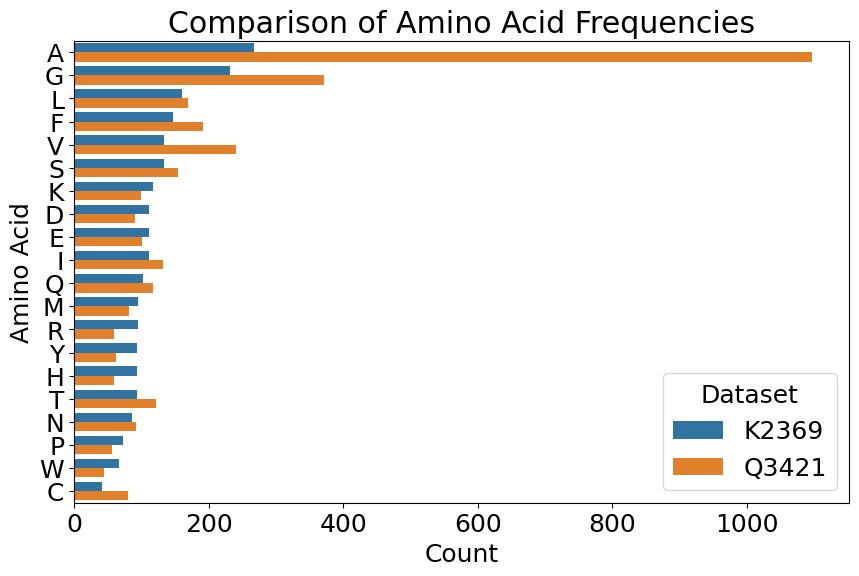

In [3]:
db2 = pd.read_csv(preds_loc.replace('k2369', 'q3421')).set_index(['uid', 'uid2'])
analysis_utils.plot_joint_histogram(db, db2, 'mutation')

##### Perform preprocessing

In [4]:
db_class = db
print('Original unique mutations:', len(db_class))

# number of interface mutations (7 Angstrom cross-chain cutoff)
print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

# define categories
evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro', 'q3421']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

# determine which columns contain predictions
original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
#print(original_pred_cols)

# separate runtimes into another dataframe
db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

# remove individual predictions from models designed to be ensembled
original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
#print(original_pred_cols_reduced)

# reduce the working dataframe to only the columns of interest
db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

# define extra columns (ensemble and baselines)
db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']
db_class['upper_bound_dir'] = db_class['ddG'] + np.random.normal(loc=0, size=len(db_class))

db_class

Original unique mutations: 2369
Detected 40 interface mutations


,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,msa_transformer_median_dir,msa_transformer_mean_dir,stability-oracle_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,upper_bound_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-10.673284,-10.676060,NaN,-10.880333,-0.36,1,-12.229596,-0.232978,-0.36,-1.533934
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-8.871069,-8.594967,-0.420,-1.567467,-1.80,2,0.315755,-1.760388,-1.80,-2.538682
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-7.518724,-7.353611,-1.156,0.794333,-1.10,2,0.204184,0.003171,-1.10,-2.144475
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-7.715471,-7.994566,0.528,1.773667,-4.60,2,3.900953,0.171263,-4.60,-5.899452
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-5.910285,-4.737221,-0.170,-2.198333,-5.20,2,-1.281482,0.616253,-5.20,-5.449937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,-6.245655,-6.258409,0.256,-1.762667,0.39,66,0.342910,-0.333362,0.39,1.722231
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.856210,-0.356228,NaN,-6.325333,0.80,3,-9.995053,1.848635,0.80,1.042205
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-10.325906,-10.967064,NaN,-3.867000,-0.97,63,-1.858303,-1.630330,-0.97,-2.224035


### Supplementary Figure 8

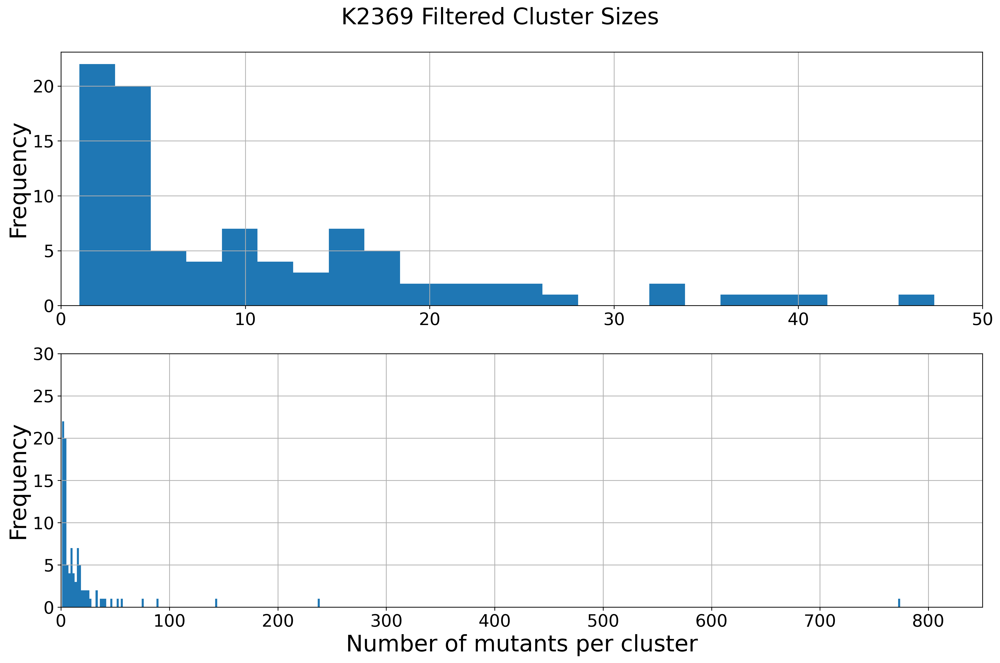

In [5]:
fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 850]) 
axes[1].set_ylim([0, 30])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('K2369 Filtered Cluster Sizes', fontsize=24)
plt.tight_layout()

In [6]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

7 92


### Recursive Feature Addition (Figure 3C)

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
esmif_multimer_dir
ankh_dir
msa_transformer_mean_dir


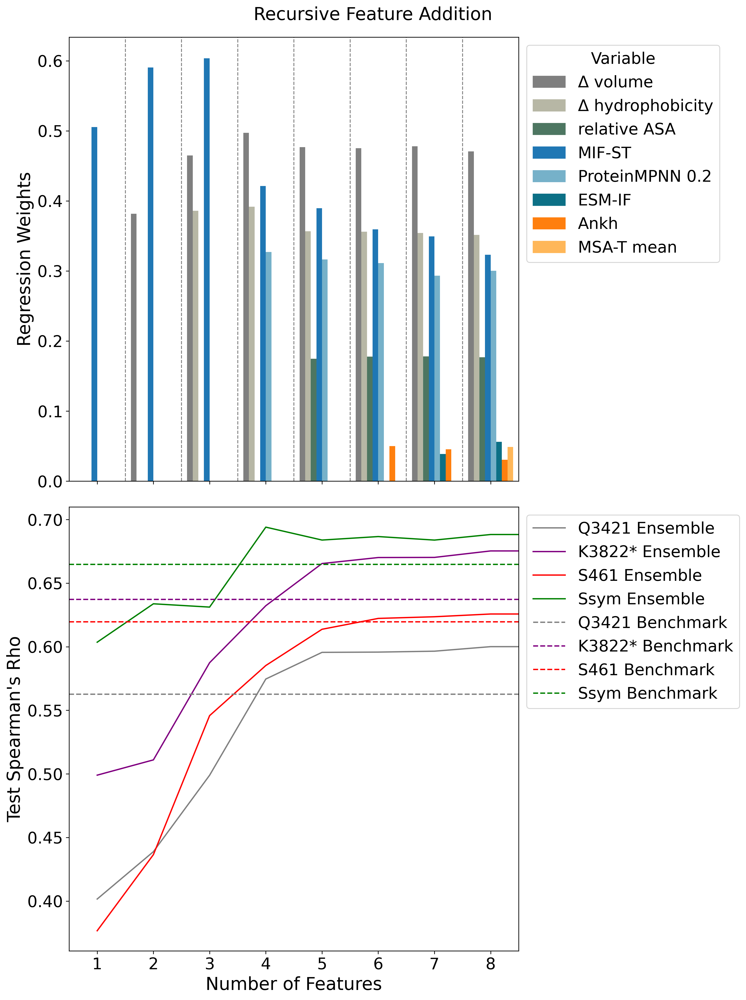

In [7]:
# which features are allowed to be used
cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir'] #'mutcomputex_dir',

# fill missing values with 0
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_korpm']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

# load and preprocess other datasets for testing the ensembles on
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_pslm' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_korpm = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_korpm = df_test_korpm[[c for c in df_test_korpm.columns if not 'K1566_pslm' in c]]
df_test_korpm.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_korpm.columns]
df_test_korpm = df_test_korpm.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_pslm' in c]]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_korpm, 's461': df_test_s461, 'ssym': df_test_ssym, 'test': df_test} #

# actaully perform the RFA
test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_pslm')

# add the predictions to the other analysis tables
db_class = db_class[[c for c in db_class.columns if not 'K1566_pslm' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)

df_test_korpm = dfs_test['K3822*']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_korpm.columns if 'K1566_pslm' in c])), axis=1)

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_pslm' in c])), axis=1)
df_test_q3421.to_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'K1566_pslm' in c], [c+'_dir' for c in df_test_s461.columns if 'K1566_pslm' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

### Recursive Feature Addition (All Models) (Not included in text)

Using 1566 training observations with less than 25\% sequence identity to Ssym or S461
delta_vol_dir
delta_kdh_dir
rel_ASA_dir
mifst_dir
mpnn_20_00_dir
msa_transformer_mean_dir
ankh_dir
cartesian_ddg_dir


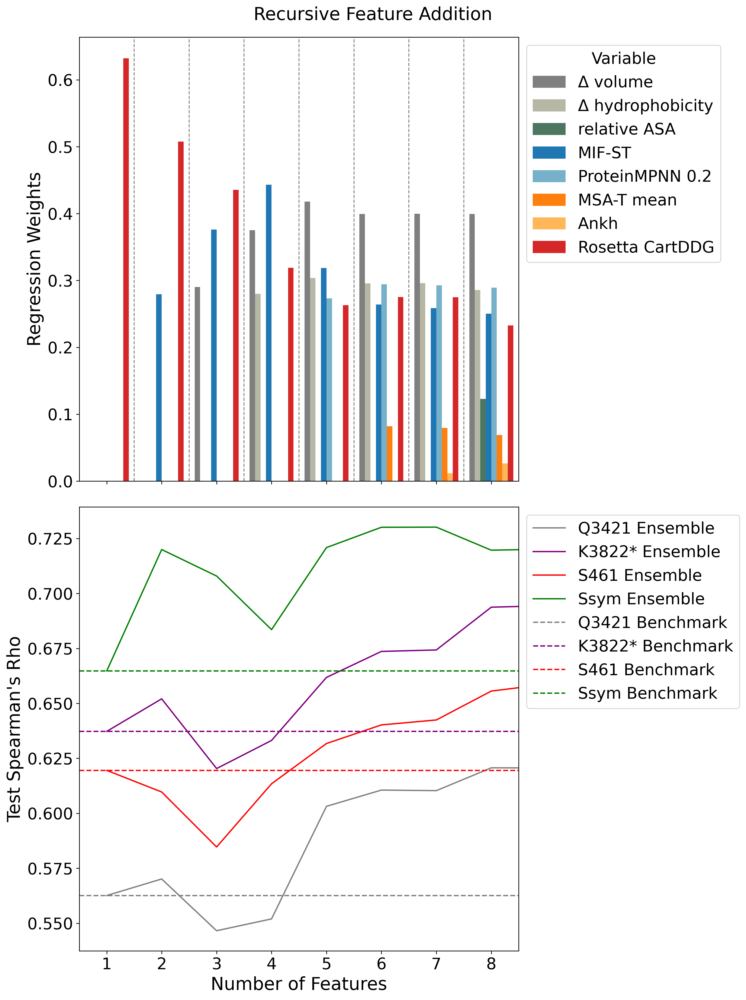

In [8]:
# Repeat the above but this time include Rosetta

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'cartesian_ddg_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_weights_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]#.loc[~df_train['overlaps_seq_korpm']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to Ssym or S461')

df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)

df_test_q3421 = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')).set_index('uid')
df_test_q3421 = df_test_q3421[[c for c in df_test_q3421.columns if not 'K1566_all' in c]]
df_test_q3421.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_q3421.columns]

df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'K1566_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]

df_test_korpm = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k3822_analysis.csv')).set_index(['uid', 'uid2'])
df_test_korpm = df_test_korpm[[c for c in df_test_korpm.columns if not 'K1566_all' in c]]
df_test_korpm.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_korpm.columns]
df_test_korpm = df_test_korpm.drop(df_train.index)

df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'K1566_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test_q3421, 'K3822*': df_test_korpm, 's461': df_test_s461, 'ssym': df_test_ssym, 'test': df_test} #

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='K1566_all')

db_class = db_class[[c for c in db_class.columns if not 'K1566_all' in c]]
db_class = db_class.join(df_test[[c for c in df_test.columns if 'rfa_' in c]]).rename(dict(zip([c for c in df_test.columns if 'K1566_all' in c], [c+'_dir' for c in df_test_q3421.columns if 'K1566_all' in c])), axis=1)

In [9]:
# remove most of the ensemble predictions from db_class (saves time on next steps)

drop_cols = [c for c in db_class.columns if 'K1566_all' in c]
#drop_cols += [c for c in db_class.columns if 'K1566_pslm' in c and not '5' in c]
db_class = db_class.drop(drop_cols, axis=1)
db_class

,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,K1566_pslm_rfa_2_dir,K1566_pslm_rfa_3_dir,K1566_pslm_rfa_4_dir,K1566_pslm_rfa_5_dir,K1566_pslm_rfa_6_dir,K1566_pslm_rfa_7_dir,K1566_pslm_rfa_8_dir,K1566_pslm_rfa_9_dir,K1566_pslm_rfa_10_dir,K1566_pslm_rfa_11_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,-0.372052,-0.642978,-0.120629,-0.336641,-0.360260,-0.303840,-0.319618,-0.319618,-0.319618,-0.381625
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,-0.747276,-1.153093,-0.481144,-0.598767,-0.644650,-0.655688,-0.662076,-0.662076,-0.662076,-0.617558
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,-0.508203,-0.908739,-0.652323,-0.847762,-0.886525,-0.874524,-0.883446,-0.883446,-0.883446,-0.849035
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,-0.860405,-0.238619,0.527572,0.423921,0.443370,0.423905,0.405850,0.405850,0.405850,0.447278
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,-0.890157,-0.797934,-0.339489,-0.394402,-0.342602,-0.356374,-0.353200,-0.353200,-0.353200,-0.338479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,1.053140,0.286426,0.580764,0.670827,0.695854,0.688453,0.617150,0.617150,0.617150,0.614567
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,-0.378599,-0.433441,-0.529294,-0.637093,-0.546427,-0.512533,-0.478431,-0.478431,-0.478431,-0.383616
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,-2.158026,-2.183060,-1.421066,-1.151588,-1.238494,-1.206809,-1.171316,-1.171316,-1.171316,-1.175461


### Non-bootstrapped Analysis of K2369 (not in text)

In [10]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 
                                           'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 
                                           'recall@k1.0', 'aumsc', 'auppc', 'PPV'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
#summ.to_csv('../data/extended/q3421_extended.csv')
tmp_ = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp_.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'PPV', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF mean', 'Clustered Ensemble', 'Ensemble 6 Feats', 'ProteinMPNN 0.2', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian Noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX', 'Theoretical Max'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# ~ 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

### Bootstrapped KORPM Analysis (Used for Figure 1b and Extended Data Table 2)

In [ ]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'auprc', 'spearman', 'net_stabilization', 'sensitivity', 'recall@k1.0', 'MCC'),  
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
tmp1.to_csv('../data/extended/k2369_extended_bootstrapped.csv')
s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

# ~ 20 minutes for 100 bootstraps

NameError: name 'importlib' is not defined

upper_bound
mpnn_rosetta
stability-oracle
cartesian_ddg
korpm
mpnn_20_00
esm2_650M
random


AUPRC Spearman's ρ Net Stabilization   MCC  \
Model Type  Model                                                              
unknown     ΔΔG label              1.00         1.00         611 ± 200  1.00   
            Theoretical Max        0.81         0.79         372 ± 117  0.54   
struc. PSLM Rosetta/ProtMPNN       0.75         0.66        194 ± 48.9  0.38   
ensemble    Ensemble 4 Feats       0.72         0.65         216 ± 120  0.42   
            Ensemble 6 Feats       0.72         0.66         226 ± 128  0.44   
            Ensemble 5 Feats       0.72         0.66         224 ± 128  0.44   
            Ensemble 7 Feats       0.71         0.66         224 ± 128  0.43   
transfer    Stability Oracle       0.71         0.60        123 ± 75.2  0.37   
biophysical Rosetta CartDDG        0.70         0.62        184 ± 85.4  0.38   
ensemble    Ensemble 3 Feats       0.69         0.60         211 ± 119  0.42   
potential   KORPM                  0.67         0.55        125 ± 89.2  0.39   
struc. PSLM ProteinMPNN 0.2        0.66         0.49        118 ± 46.2  0.31   
ensemble    Ensemble 2 Feats       0.65         0.52        135 ± 93.0  0.34   
struc. PSLM ProteinMPNN 0.1        0.65         0.48        116 ± 43.7  0.29   
            ProteinMPNN 0.3        0.65         0.48        108 ± 40.9  0.30   
            MIF                    0.63         0.48       95.4 ± 37.0  0.27   
            ESM-IF                 0.63         0.41       98.0 ± 36.2  0.27   
            MIF-ST                 0.63         0.45        101 ± 31.2  0.25   
seq. PSLM   MSA-T mean             0.59         0.36       27.2 ± 25.2  0.19   
            MSA-T median           0.58         0.35       26.4 ± 25.5  0.18   
            Ankh                   0.58         0.37       74.7 ± 31.7  0.22   
            ESM-2 15B              0.57         0.36       61.6 ± 22.2  0.19   
            ESM-2 650M             0.57         0.33       75.2 ± 32.0  0.21   
            ESM-2 3B               0.55         0.32       39.6 ± 23.6  0.17   
            ESM-1V mean            0.55         0.26       27.7 ± 36.3  0.19   
            ESM-1V median          0.55         0.26       14.9 ± 40.7  0.18   
            ESM-2 150M             0.55         0.26      -18.3 ± 66.8  0.20   
            Tranception            0.54         0.33       44.9 ± 17.8  0.14   
            Tranception (reduced)  0.53         0.32       33.7 ± 15.4  0.13   
unknown     Gaussian Noise         0.41         0.00        -342 ± 121  0.03   
NaN         Avg. Dev.              0.04         0.06             62.9   0.05   

                                  Sensitivity Recall @ k1  
Model Type  Model                                          
unknown     ΔΔG label                    1.00        1.00  
            Theoretical Max              0.70        0.44  
struc. PSLM Rosetta/ProtMPNN             0.34        0.32  
ensemble    Ensemble 4 Feats             0.58        0.34  
            Ensemble 6 Feats             0.60        0.29  
            Ensemble 5 Feats             0.60        0.30  
            Ensemble 7 Feats             0.60        0.29  
transfer    Stability Oracle             0.47        0.28  
biophysical Rosetta CartDDG              0.46        0.34  
ensemble    Ensemble 3 Feats             0.57        0.31  
potential   KORPM                        0.52        0.31  
struc. PSLM ProteinMPNN 0.2              0.33        0.30  
ensemble    Ensemble 2 Feats             0.49        0.27  
struc. PSLM ProteinMPNN 0.1              0.30        0.30  
            ProteinMPNN 0.3              0.35        0.30  
            MIF                          0.31        0.29  
            ESM-IF                       0.25        0.25  
            MIF-ST                       0.22        0.26  
seq. PSLM   MSA-T mean                   0.18        0.16  
            MSA-T median                 0.18        0.16  
            Ankh                         0.17        0.20  
            E

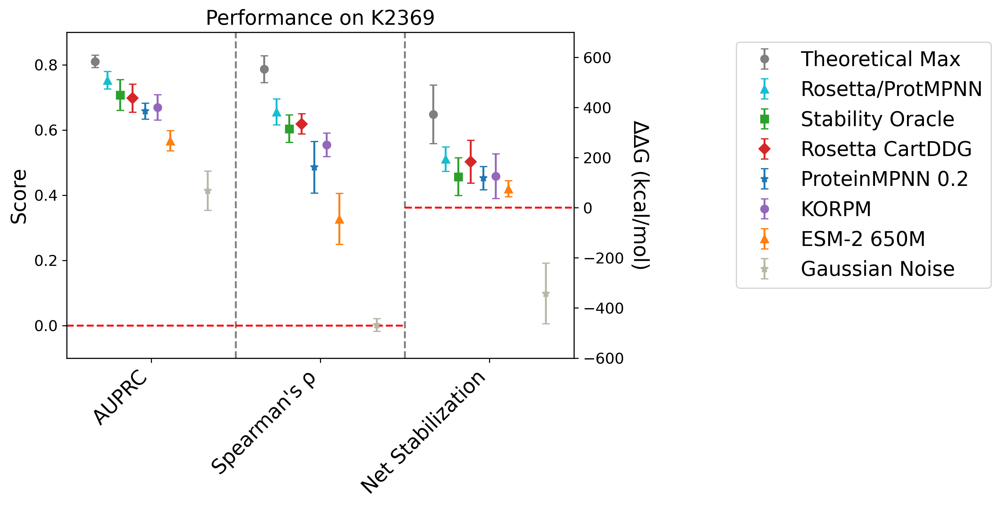

In [ ]:
plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 0.9)
right_y_lim = (-600, 700)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0']
saveloc = '../data/extended/k2369_bootstrapped_formatted.csv'
analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], 
                sort_col='auprc',
                saveloc=saveloc)

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2b)

In [ ]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))

db_class_r['upper_bound_2_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_3_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_4_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_5_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))

class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn.loc[crn['model'].str.contains('upper_bound'), 'model'] = 'upper_bound_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
#crn

# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir
cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir


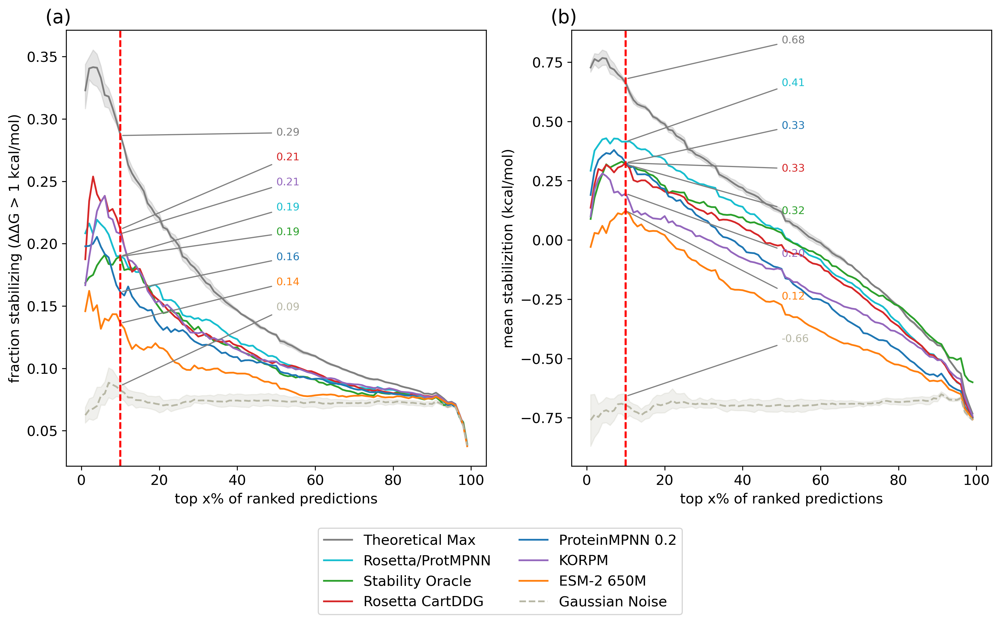

In [ ]:
analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_rosetta_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esm2_650M_dir',  'random_dir'], left_spacing=(0.04), left_text_offset=(40, 0.), right_spacing=0.06, right_text_offset=(40, 0.15), measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
upper_bound_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
esm2_650M_dir
random_dir
ankh_dir
upper_bound_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
esm2_650M_dir
random_dir


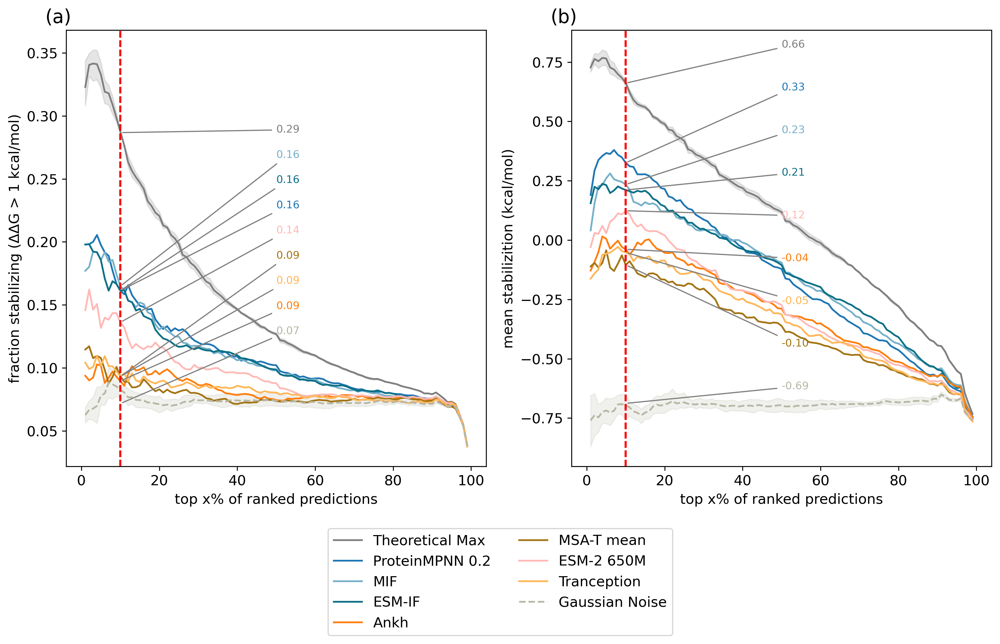

In [ ]:
analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'random_dir'], left_spacing=(0.04), left_text_offset=(40, 0.), right_spacing=0.06, right_text_offset=(40, 0.15), measurements=['ddG'], plots=['auppc', 'aumsc'])

### Supplementary Table 5

In [ ]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp2 = summ2.reset_index()

# ~ 15 minutes for 100 bootstraps

upper_bound
stability-oracle
korpm
random
mpnn_20_00
esm2_650M
cartesian_ddg
mpnn_rosetta


MSE Accuracy Spearman's ρ     wρ  \
Model Type  Model                                                             
unknown     ΔΔG label              0.00 ± 0.00     1.00         1.00   1.00   
            Theoretical Max        1.02 ± 0.03     0.78         0.78   0.70   
ensemble    Ensemble 6 Feats       1.56 ± 0.38     0.73         0.66   0.49   
            Ensemble 5 Feats       1.56 ± 0.38     0.73         0.66   0.49   
            Ensemble 7 Feats       1.57 ± 0.38     0.73         0.66   0.49   
transfer    Stability Oracle       1.61 ± 0.17     0.70         0.60   0.48   
ensemble    Ensemble 4 Feats       1.61 ± 0.39     0.72         0.65   0.50   
            Ensemble 3 Feats       1.73 ± 0.43     0.73         0.59   0.42   
potential   KORPM                  1.75 ± 0.37     0.71         0.55   0.44   
ensemble    Ensemble 2 Feats       2.01 ± 0.51     0.69         0.52   0.37   
struc. PSLM ESM-IF                 3.03 ± 0.91     0.65         0.40   0.43   
seq. PSLM   Tranception (reduced)  3.10 ± 0.91     0.61         0.31   0.24   
            Tranception            3.10 ± 0.92     0.61         0.33   0.25   
unknown     Gaussian Noise         3.64 ± 0.64     0.57         0.00  -0.02   
struc. PSLM ProteinMPNN 0.3        7.36 ± 1.49     0.66         0.47   0.45   
            ProteinMPNN 0.2        7.84 ± 1.59     0.67         0.47   0.44   
            ProteinMPNN 0.1        8.41 ± 1.54     0.66         0.47   0.42   
seq. PSLM   ESM-2 150M             21.6 ± 5.28     0.62         0.24   0.27   
            ESM-1V mean            26.5 ± 3.62     0.63         0.25   0.27   
            ESM-1V median          26.5 ± 3.59     0.62         0.25   0.26   
            ESM-2 650M             29.1 ± 4.50     0.63         0.32   0.31   
struc. PSLM MIF                    30.7 ± 6.55     0.65         0.47   0.44   
seq. PSLM   MSA-T mean             32.3 ± 5.90     0.63         0.36   0.25   
            MSA-T median           32.5 ± 5.86     0.63         0.36   0.26   
biophysical Rosetta CartDDG        32.6 ± 3.67     0.71         0.62   0.46   
struc. PSLM MIF-ST                 34.5 ± 3.08     0.64         0.45   0.38   
seq. PSLM   Ankh                   37.5 ± 3.48     0.63         0.36   0.24   
            ESM-2 3B               39.4 ± 4.31     0.62         0.32   0.29   
            ESM-2 15B              46.0 ± 3.73     0.63         0.36   0.27   
struc. PSLM Rosetta/ProtMPNN       66.6 ± 7.19     0.69         0.65   0.53   
NaN         Avg. Dev.                    2.48      0.04         0.05   0.03   

                                   NDCG wNDCG  
Model Type  Model                              
unknown     ΔΔG label              1.00  1.00  
            Theoretical Max        0.89  0.86  
ensemble    Ensemble 6 Feats       0.82  0.75  
            Ensemble 5 Feats       0.82  0.74  
            Ensemble 7 Feats       0.82  0.74  
transfer    Stability Oracle       0.75  0.77  
ensemble    Ensemble 4 Feats       0.83  0.75  
            Ensemble 3 Feats       0.81  0.74  
potential   KORPM                  0.78  0.74  
ensemble    Ensemble 2 Feats       0.80  0.71  
struc. PSLM ESM-IF                 0.76  0.72  
seq. PSLM   Tranception (reduced)  0.71  0.67  
            Tranception            0.71  0.67  
unknown     Gaussian Noise         0.67  0.61  
struc. PSLM ProteinMPNN 0.3        0.81  0.74  
            ProteinMPNN 0.2        0.78  0.73  
            ProteinMPNN 0.1        0.79  0.74  
seq. PSLM   ESM-2 150M             0.76  0.68  
            ESM-1V mean            0.75  0.67  
            ESM-1V median          0.75  0.68  
            ESM-2 650M             0.75  0.69  
struc. PSLM MIF                    0.77  0.70  
seq. PSLM   MSA-T mean             0.73  0.67  
            MSA-T median           0.73  0.67  
biophysical Rosetta CartDDG        0.81  0.74  
struc. PSLM MIF-ST                 0.77  0.71  
seq. PSLM   Ankh                   0.72  0.67  
            ESM-2 3B               0.71  0.

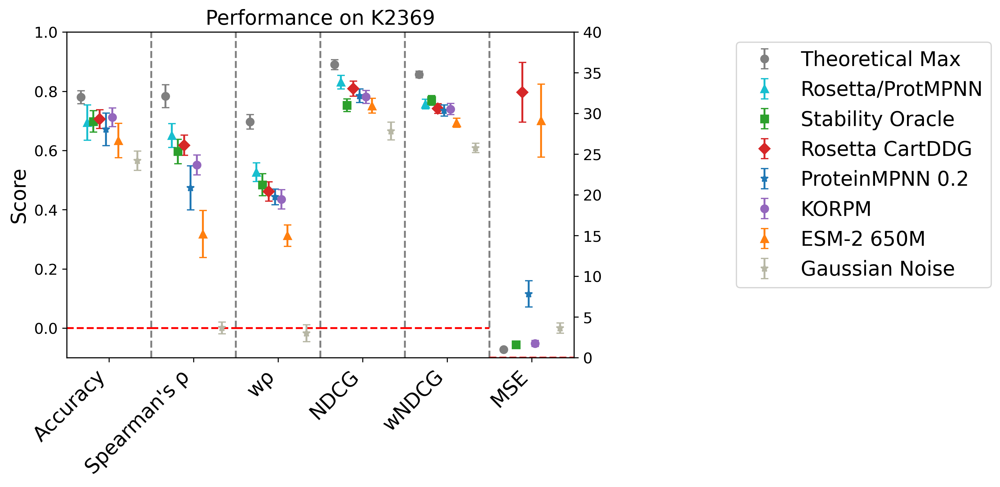

In [ ]:
importlib.reload(analysis_utils)
ss2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
ss3 = ss2.loc[ss2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg', 'mean_squared_error']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'K2369'
y_lim = (-0.1, 1)
right_y_lim = (0, 60)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg']
analysis_utils.bootstrap_table(ss3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                sort_order='ascending',
                saveloc='../data/extended/k2369_bootstrapped_formatted_extra.csv'
                )

### Correlation between predictions and scores of two selected models
##### Version with Q3421 is used in text. Feel free the change which models are compared

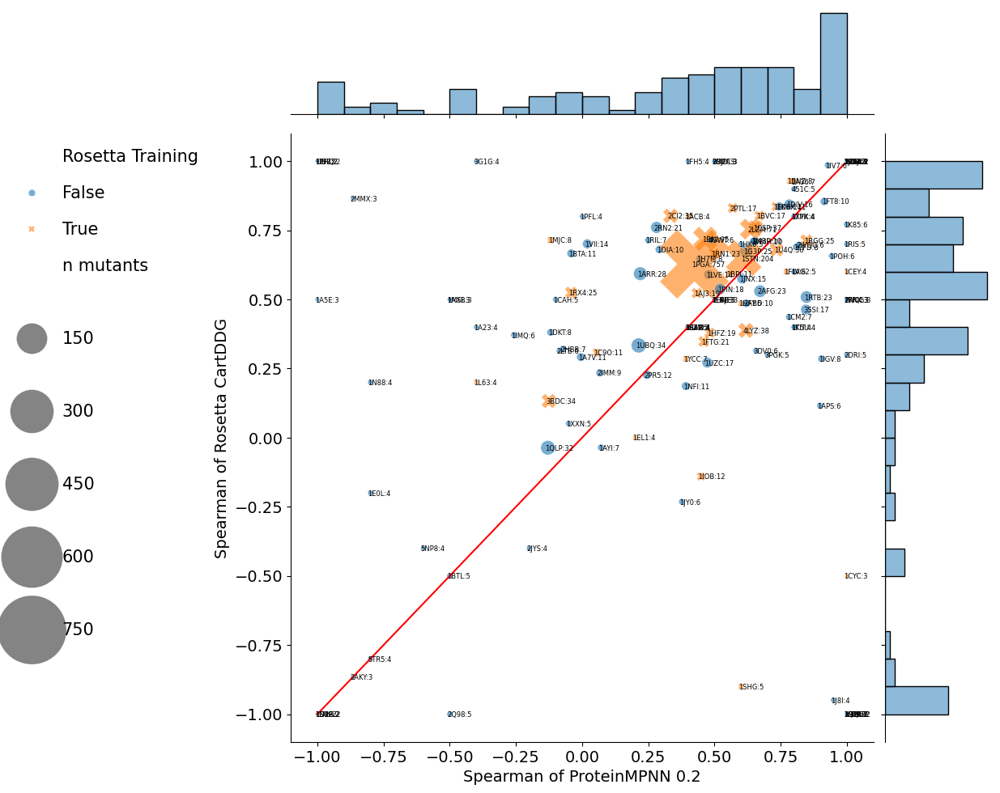

In [ ]:
col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_ = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

### Extended Data Figure 2

mpnn_30_00_dir
mpnn_20_00_dir
mpnn_10_00_dir
esm2_150M_dir
esm2_650M_dir
esm2_3B_dir
esm2_15B_half_dir
ddG_dir


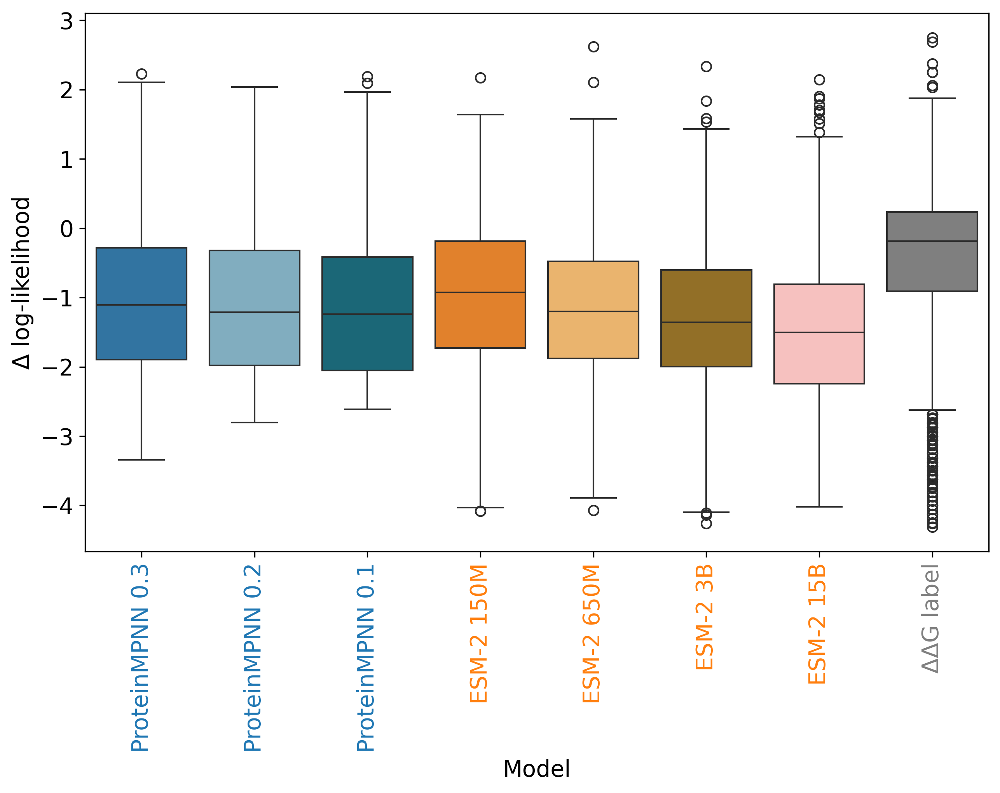

In [ ]:
dbc2 = db_class[['mpnn_30_00_dir', 'mpnn_20_00_dir', 'mpnn_10_00_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'ddG_dir']]
dbc2 /= dbc2.std()
cols = dbc2.columns
db_cols = pd.DataFrame(data=cols)
cmap = analysis_utils.get_color_mapping(db_cols, 0)
plt.figure(figsize=(10, 6), dpi=300)
ax = sns.boxplot(dbc2, palette=cmap)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('Δ log-likelihood')
ax.set_xlabel('Model')
for tick_label in ax.get_xticklabels():
    tick_label.set_color(analysis_utils.determine_base_color(tick_label))
_ = ax.set_xticklabels([remap_names_2.get(str(a).split('\'')[1],str(a).split('\'')[1]) for a in ax.get_xticklabels()])

##### The following cells are for Figure 4. We compiled several figures together

In [ ]:
# choose which models are used for the feature based analyses

subset = ['K1566_pslm_rfa_6_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'upper_bound_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

### Figure 4a (only top part is used)

  0%|          | 0/1000 [00:00<?, ?it/s]

['ΔΔG <= -1.5', '0 >= ΔΔG > -1.5', 'ΔΔG > 0']
class
0 >= ΔΔG > -1.5    497
ΔΔG <= -1.5        364
ΔΔG > 0            621
Name: n, dtype: int64


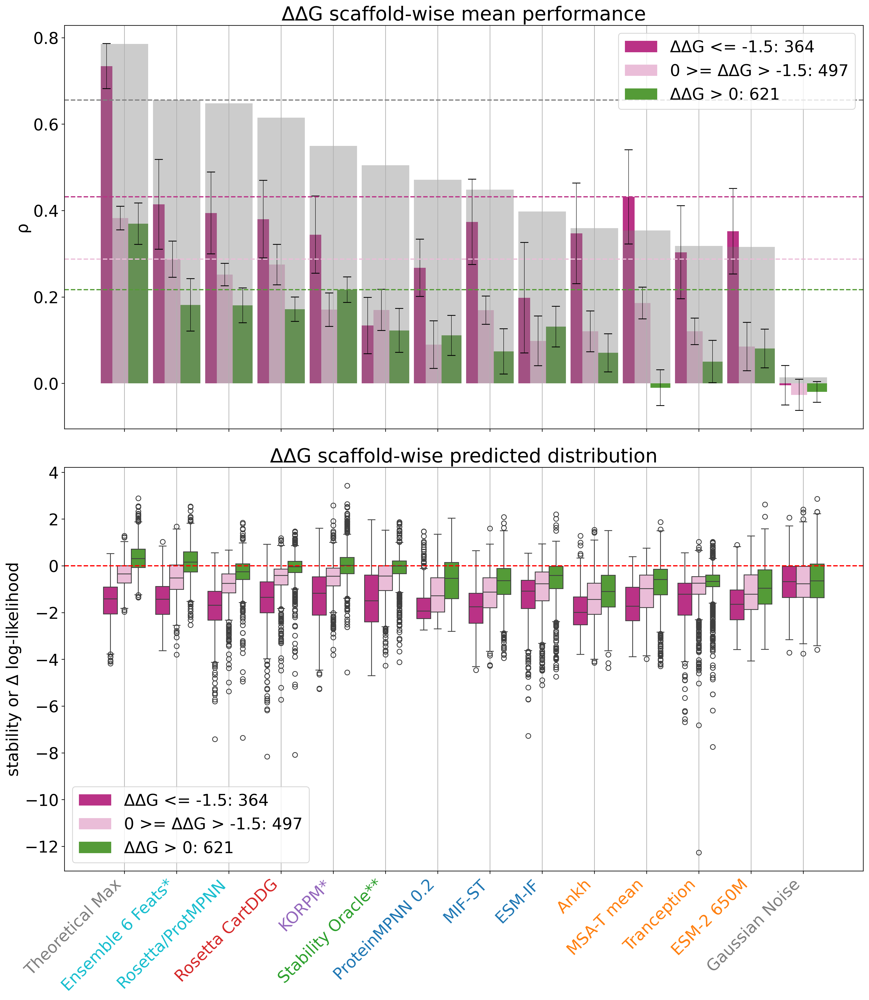

In [ ]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'both',
                        drop_label = True,
                        asterisk = ('KORPM', 'Ensemble 6 Feats'),
                        double_asterisk = ('Stability Oracle',),
                        legend_loc = 'upper right'
                        )

### Figure 4b (only top half is used)

  0%|          | 0/1000 [00:00<?, ?it/s]

['neff <= 70 & conservation <= 70', 'neff > 70 & conservation <= 70', 'conservation > 70']
neff <= 70 & conservation <= 70% : 514
neff > 70 & conservation <= 70% : 791
conservation > 70% : 191
class
conservation > 70                  191
neff <= 70 & conservation <= 70    514
neff > 70 & conservation <= 70     791
Name: n, dtype: int64


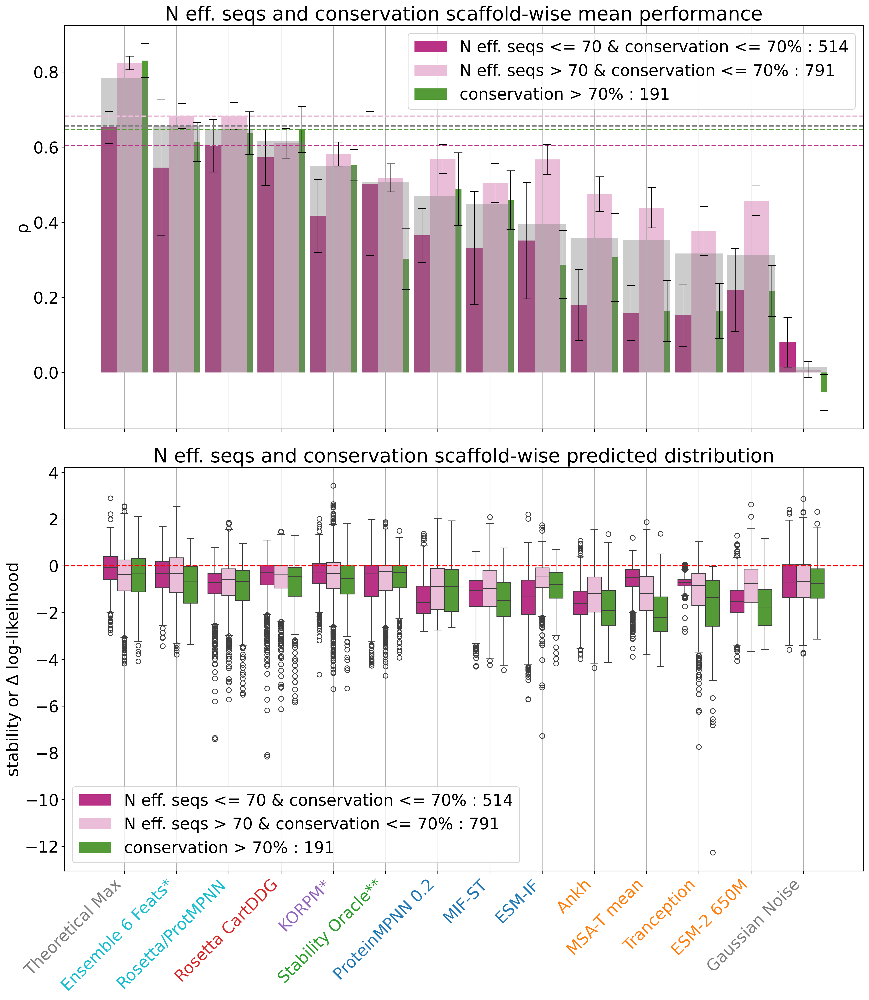

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 70,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='both',
                        drop_label = True,
                        asterisk=('KORPM', 'Ensemble 6 Feats'),
                        double_asterisk=('Stability Oracle',),
                        split_last=False,
                        legend_loc='upper right' 
                        )

### Extended Data Figure 6 (bottom part is used, had to be regenerated to add the label)

  0%|          | 0/1000 [00:00<?, ?it/s]

['neff <= 70 & conservation <= 70', 'neff > 70 & conservation <= 70', 'conservation > 70']
neff <= 70 & conservation <= 70% : 516
neff > 70 & conservation <= 70% : 797
conservation > 70% : 193
class
conservation > 70                  193
neff <= 70 & conservation <= 70    516
neff > 70 & conservation <= 70     797
Name: n, dtype: int64


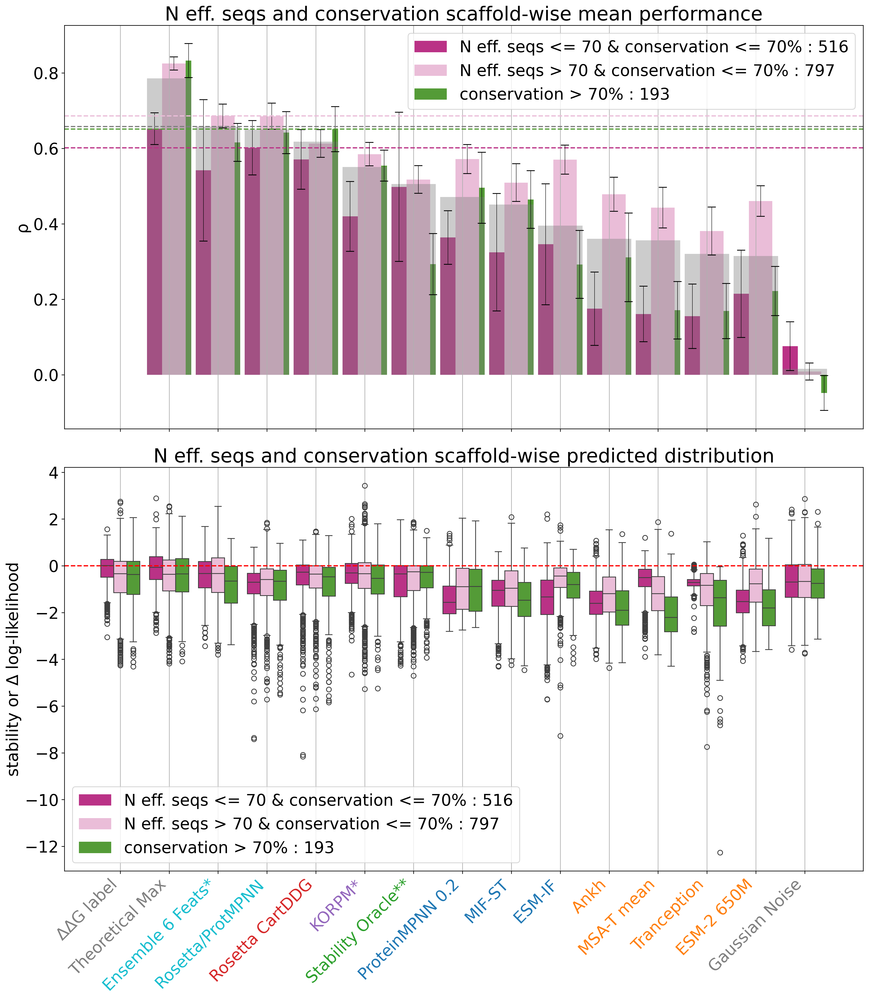

In [ ]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 70,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        order=model_order,
                        plots='both',
                        drop_label = False,
                        asterisk=('KORPM', 'Ensemble 6 Feats'),
                        double_asterisk=('Stability Oracle',),
                        split_last=False,
                        legend_loc='upper right' 
                        )

### Figure 4 c&d

  0%|          | 0/1000 [00:00<?, ?it/s]

['rel_ASA <= 0.2 & delta_kdh <= 0', 'rel_ASA <= 0.2 & delta_kdh > 0', 'rel_ASA > 0.2 & delta_kdh <= 0', 'rel_ASA > 0.2 & delta_kdh > 0']
class
rel_ASA <= 0.2 & delta_kdh <= 0    295
rel_ASA <= 0.2 & delta_kdh > 0     201
rel_ASA > 0.2 & delta_kdh <= 0     436
rel_ASA > 0.2 & delta_kdh > 0      584
Name: n, dtype: int64


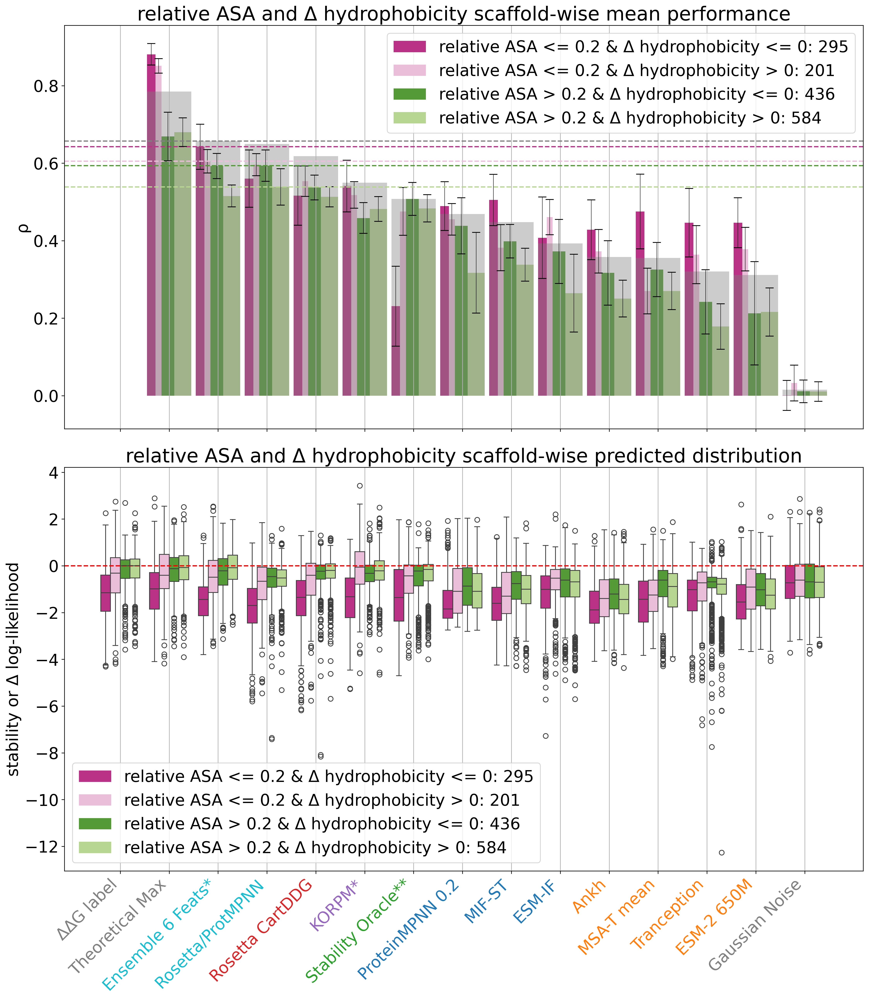

In [ ]:
current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)

#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'rel_ASA',  
                        split_col_2 = 'delta_kdh',
                        threshold_1 = 0.2, 
                        threshold_2 = 0, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        drop_label=False,
                        asterisk=('KORPM', 'Ensemble 6 Feats'),
                        double_asterisk=('Stability Oracle',),
                        legend_loc='upper right'
                        )
# < 10 seconds

##### Next cells are for generating the pairwise ensembles used in the model complementarity section (related to Figure 3a&b)
##### Note that these are not featured in the text

In [ ]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
#dfm

def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ
    
# < 10 seconds

concatenating
joining...


,,esmif_multimer_dir,esm2_3B_dir,esm2_15B_half_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,mif_dir,mifst_dir,esm2_150M_dir,esm2_650M_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,0.000611,-13.121611,-10.045898,-0.868792,-1.349262,0.501946,-7.472339,-11.654044,-10.383169,-10.866617,...,6,0,0,0,0,0,0,0,0,0
1A23_30S,1A23_30S,-0.043712,-11.571676,-11.668701,1.966927,1.883221,-0.990958,1.864485,-6.805952,-9.410211,-8.321783,...,5,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-0.024960,-12.002896,-12.722168,1.284340,-0.590150,0.144643,0.348253,-5.093968,-7.901006,-8.226297,...,6,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-0.042389,-13.755667,-13.076172,-0.284132,2.127287,-0.263297,1.119251,-7.800102,-10.590076,-6.658664,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.029983,-8.291791,-10.436035,0.308985,0.916851,0.773268,-0.854073,-5.414868,-5.397206,-3.793028,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2RPN_21K,2RPN_21K,0.027008,-0.922159,1.738525,1.976867,2.105576,2.021208,3.257286,3.271853,3.515588,2.811706,...,420,0,0,0,0,0,0,0,0,0
1NFI_203L,1NFI_134L,-0.015014,-0.272333,1.275391,-2.453734,-3.669720,-2.377865,0.287117,-6.147088,0.095409,0.499470,...,5,0,0,0,0,0,0,0,0,0
1VII_64A,1VII_24A,0.030383,-11.894410,-12.566406,1.503718,2.008697,1.893616,1.031978,-10.141825,-9.803039,-11.242952,...,5,0,0,0,0,0,0,0,0,0


##### Pairwise statistics for all model combinations (data/pairwise)

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours, uncomment if desired)
#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_korpm_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_korpm_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                           class             
biophysical cartesian_ddg_dir + stability-oracle_dir * 1    NaN    0.835171   
            stability-oracle_dir + cartesian_ddg_dir * 1    NaN    0.835171   
            stability-oracle_dir + cartesian_ddg_dir * 0.5  NaN    0.828674   
            cartesian_ddg_dir + stability-oracle_dir * 0.5  NaN    0.832857   
potential   stability-oracle_dir + korpm_dir * 0.5          NaN    0.830664   
transfer    stability-oracle_dir + mpnn_20_00_dir * 1       NaN    0.796663   
            mpnn_20_00_dir + stability-oracle_dir * 1       NaN    0.796663   
            stability-oracle_dir + mpnn_10_00_dir * 0.5     NaN    0.809119   
            stability-oracle_dir + mpnn_20_00_dir * 0.5     NaN    0.808797   
            stability-oracle_dir + mpnn_10_00_dir * 1       NaN    0.797420   
            mpnn_10_00_dir + stability-oracle_dir * 1       NaN    0.797420   
            stability-oracle_dir + esmif_multimer_dir * 1   NaN    0.773136   
            esmif_multimer_dir + stability-oracle_dir * 1   NaN    0.773136   
            stability-oracle_dir + mifst_dir * 0.5          NaN    0.810274   
biophysical stability-oracle_dir + cartesian_ddg_dir * 0.2  NaN    0.816629   
potential   stability-oracle_dir + korpm_dir * 1            NaN    0.832167   
            korpm_dir + stability-oracle_dir * 1            NaN    0.832167   
            stability-oracle_dir + korpm_dir * 0.2          NaN    0.819081   
transfer    stability-oracle_dir + esmif_multimer_dir * 0.5 NaN    0.791728   
            stability-oracle_dir + mif_dir * 0.5            NaN    0.798098   

                                                                      auprc  \
model_type  model                                           class             
biophysical cartesian_ddg_dir + stability-oracle_dir * 1    NaN    0.766365   
            stability-oracle_dir + cartesian_ddg_dir * 1    NaN    0.766365   
            stability-oracle_dir + cartesian_ddg_dir * 0.5  NaN    0.755596   
            cartesian_ddg_dir + stability-oracle_dir * 0.5  NaN    0.759755   
potential   stability-oracle_dir + korpm_dir * 0.5          NaN    0.759467   
transfer    stability-oracle_dir + mpnn_20_00_dir * 1       NaN    0.721455   
            mpnn_20_00_dir + stability-oracle_dir * 1       NaN    0.721455   
            stability-oracle_dir + mpnn_10_00_dir * 0.5     NaN    0.727841   
            stability-oracle_dir + mpnn_20_00_dir * 0.5     NaN    0.727892   
            stability-oracle_dir + mpnn_10_00_dir * 1       NaN    0.719859   
            mpnn_10_00_dir + stability-oracle_dir * 1       NaN    0.719859   
            stability-oracle_dir + esmif_multimer_dir * 1   NaN    0.707109   
            esmif_multimer_dir + stability-oracle_dir * 1   NaN    0.707109   
            stability-oracle_dir + mifst_dir * 0.5          NaN    0.733409   
biophysical stability-oracle_dir + cartesian_ddg_dir * 0.2  NaN    0.735443   
potential   stability-oracle_dir + korpm_dir * 1            NaN    0.762546   
            korpm_dir + stability-oracle_dir * 1            NaN    0.762546   
            stability-oracle_dir + korpm_dir * 0.2          NaN    0.738958   
transfer    stability-oracle_dir + esmif_multimer_dir * 0.5 NaN    0.717074   
            stability-oracle_dir + mif_dir * 0.5            NaN    0.716732   

                                                                   0.0_n_stable  \
model_type  model                                           class                 
biophysical cartesian_ddg_dir + stability-oracle_dir * 1    NaN           909.0   
            stability-oracle_dir + cartesian_ddg_dir * 1    NaN           909.0   
            stability-oracle_dir + cartesian_ddg_dir * 0.5  NaN           909.0   
            cartesian_ddg_dir + stability-oracle_dir * 0.5  NaN           909.0   
potential   stability-oracle_dir + korpm_dir * 0.5          NaN           909.0   
transfer   

### Complement for Figure 3a&b (except on K2369 dataset)

In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'ankh_dir',
            'esm2_650M_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2, title='K2369')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df.head()

NameError: name 'd1' is not defined

### Complement for Extended Data Figurse 3&4 (except on K2369 dataset)

2369


  0%|          | 0/100 [00:00<?, ?it/s]

81.68299999999998
['Rosetta CartDDG', 'KORPM', 'ProteinMPNN 0.2', 'Stability Oracle', 'MIF-ST', 'ESM-IF', 'MIF', 'ESM-2 650M', 'Ankh', 'Tranception', 'MSA-T mean', 'ESM-1V mean']


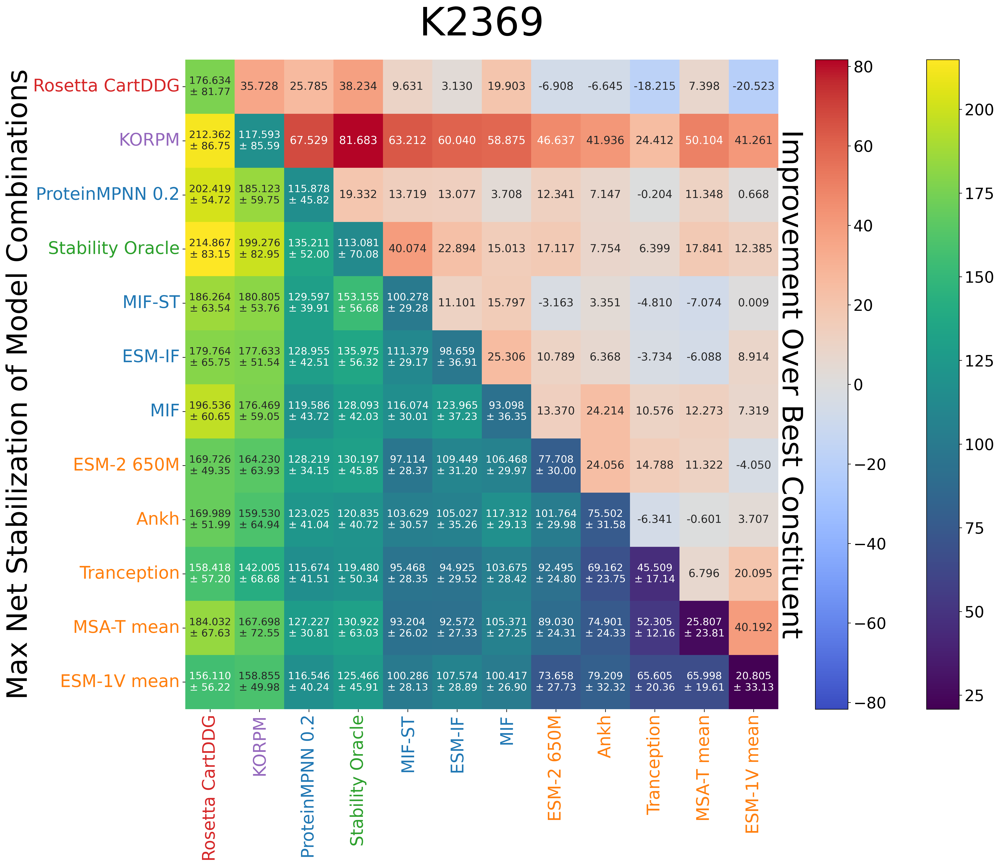

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,1,214.86748,0.0
2,cartesian_ddg_dir,1,stability-oracle_dir,0.5,214.01448,0.0
3,cartesian_ddg_dir,1,korpm_dir,0.5,212.3619,0.0
4,cartesian_ddg_dir,1,korpm_dir,0.2,208.2741,0.0
5,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,202.41855,0.0


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2, title='K2369')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df.head()

# ~ 10 seconds

### Complement for Supplementary Figure 4 (except on K2369 dataset)

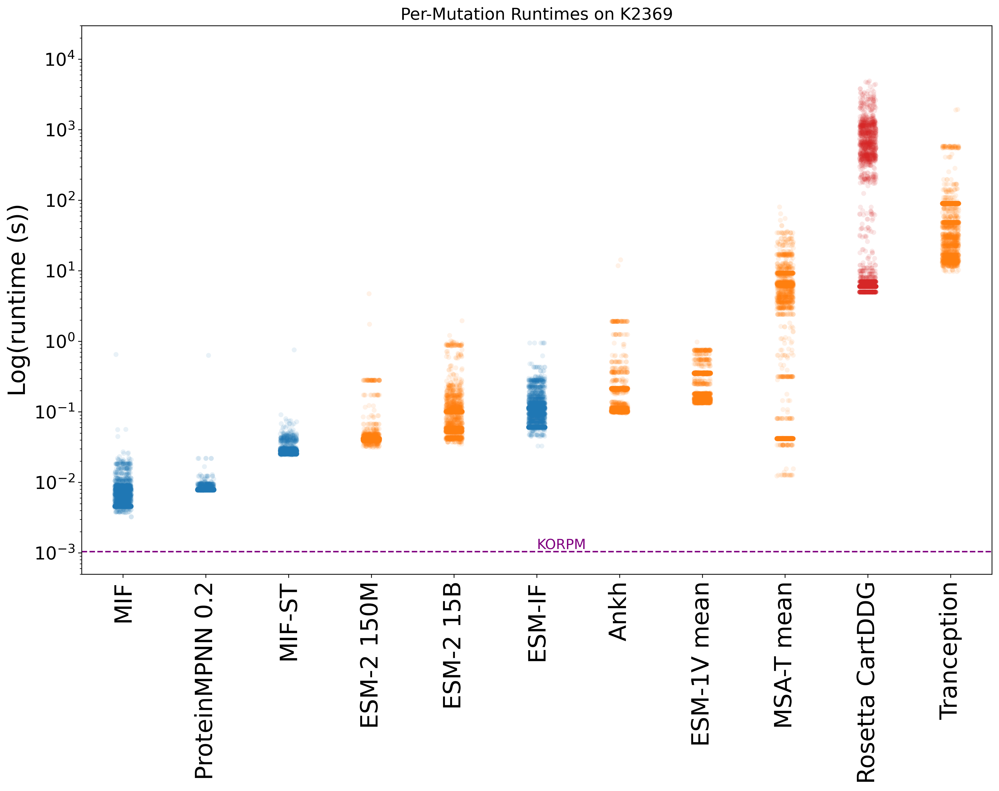

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on K2369')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Supplementary Figure 3

In [ ]:
#db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
korpm_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_boxes([korpm_feats,db,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)